In [1]:
'''
  _____  _    _ _   _   _______ _    _ _____  _____    _____ ______ _      _        ______ _____ _____   _____ _______ 
 |  __ \| |  | | \ | | |__   __| |  | |_   _|/ ____|  / ____|  ____| |    | |      |  ____|_   _|  __ \ / ____|__   __|
 | |__) | |  | |  \| |    | |  | |__| | | | | (___   | |    | |__  | |    | |      | |__    | | | |__) | (___    | |   
 |  _  /| |  | | . ` |    | |  |  __  | | |  \___ \  | |    |  __| | |    | |      |  __|   | | |  _  / \___ \   | |   
 | | \ \| |__| | |\  |    | |  | |  | |_| |_ ____) | | |____| |____| |____| |____  | |     _| |_| | \ \ ____) |  | |   
 |_|  \_\\____/|_| \_|    |_|  |_|  |_|_____|_____/   \_____|______|______|______| |_|    |_____|_|  \_\_____/   |_|  
'''
# Disturbance profiles were uploaded to Github so markers can access them through this notebook. Let's get them.
!rm -rf CHBE356-data
!git clone https://github.com/TimHillmer/CHBE356-data/

# obtain a numerically ordered list of the paths to the disturbance profiles
import glob
filenames = glob.glob('CHBE356-data/Disturbance_profiles/*.csv')
filenames.sort()

# obtain an array containing all disturbance profiles (data in [profile#, timevalue] format)
import numpy as np
import pandas as pd
df = pd.concat([pd.read_csv(files).transpose() for files in filenames], ignore_index = True)
# each disturbance profile is a *row*

# define Yankai's 100 point interpolation
from scipy.interpolate import interp1d
Ti_data = df.values
time_data = np.arange(len(Ti_data[0]))  # assume Ti' data is given at each second
f = interp1d(time_data, Ti_data)
points_per_second = 100
time = np.linspace(time_data[0], time_data[-1], len(time_data)*points_per_second)
TiPrimes = f(time)

# Any remaining install/imports here
! pip install git+https://github.com/python-control/python-control@601b58152080d89575cc677474ec7714e1a34ee2
import control
import matplotlib.pyplot as plt


def masterplan(KC, TauI, TauD, TauC, plots=True, summary=True, failwarning=True):
    s = control.tf([1,0],[0,1])  # Define the s variable
    Gd = (s+1) / (s**2+s+1)  # T' / Ti' (disturbance) transfer function
    Gp = 1 / (s**2+s+1)  # T' / Q' (process) transfer function
    Gc = KC*(1 + 1/(TauI*s) + TauD*s/(TauC*s+1))  # Controller transfer function

    Gtotal = Gd / (1 + Gp*Gc)  # no term for (temperature deviation) setpoint because it is always zero
    
    if plots or summary:
        plt.style.use('seaborn')  # plot style for if 'plots' or 'summary' are marked True
        params = {'legend.fontsize': 'x-large',
          'figure.figsize': (20, 9),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}
        plt.rcParams.update(params)

    Perf = np.zeros(len(TiPrimes))  # array to store Perf for each disturbance profile
    for i in range(len(TiPrimes)):  # main loop for calculation and plotting
        # T' response including controller
        t, Tprime, x = control.forced_response(Gtotal, time, TiPrimes[i])

        # controller response to error (=input)
        t, Qprime, x = control.forced_response(Gc, time, -Tprime)

        Perf[i] = (sum(np.absolute(Tprime)) + 0.2*sum(np.absolute(Qprime)))/points_per_second  
        # performance metric for each profile

        if plots == True: # plot results from the forced_repsonse calculations. Delete the dashed lines when submitting.
            plt.plot(time, TiPrimes[i], label = f"Disturbance Ti' (profile {i})")  # disturbance signal
            
            # response to disturbance (as if there were no controller)
            t, zero, x = control.forced_response(Gd, time, TiPrimes[i])
            plt.plot(t, zero, '--', label = 'zero input response')
            
            plt.plot(t, Tprime, label = "CV: Output T'")  # output value used for performance metric
            plt.plot(t, Qprime, label = "MV: Input Q'")  # input value used for performance metric
            
#             # T' response to input (as if disturbance were always =0)
#             t, ideal, x = control.forced_response(Gp, time, Qprime)
#             plt.plot(t, ideal, '--', label = 'response to input')  # should be output minus disturbance response
            
            plt.legend(fontsize='large')
            plt.xlabel('Time (seconds)')
            plt.ylabel("T' (temperature) and Q' (heat rate)")
            plt.show()

    if summary == True:  # prints parameters, three-point summary, and a "density" distribution    
        print(f'Variables:\nKC =   {KC},\nTauI = {TauI},\nTauD = {TauD},\nTauC = {TauC}\n')
        print('Minimum value of Perf = ', min(Perf))
        print('Maximum value of Perf = ', max(Perf))
        print('Average value of Perf = ', np.average(Perf))
        plt.plot(Perf, '.')
        plt.plot(np.arange(len(TiPrimes)), np.full(len(TiPrimes),np.average(Perf)), label = 'Average')
        plt.xlabel('Profile Numer')
        plt.ylabel("Performance Metric")
        plt.legend()
        plt.show()

    if failwarning and ( any(abs(Tprime)>5) or any(abs(Qprime)>5) ):  # failure condition defined by  project statement
        print(f'The case ({KC}, {TauI}, {TauD}, {TauC}) will score you an automatic ZERO')

    return np.average(Perf)

Cloning into 'CHBE356-data'...
remote: Enumerating objects: 68, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 174 (delta 14), reused 0 (delta 0), pack-reused 106
Receiving objects: 100% (174/174), 995.52 KiB | 6.42 MiB/s, done.
Resolving deltas: 100% (14/14), done.
  Cloning https://github.com/python-control/python-control (to revision 601b58152080d89575cc677474ec7714e1a34ee2) to /tmp/pip-req-build-curkeqbn
  Stored in directory: /tmp/pip-ephem-wheel-cache-08k_3u4h/wheels/d5/fa/66/d16620c4f2aa2183831970718f2fe9cf08dbca08c714a76668
Successfully built control


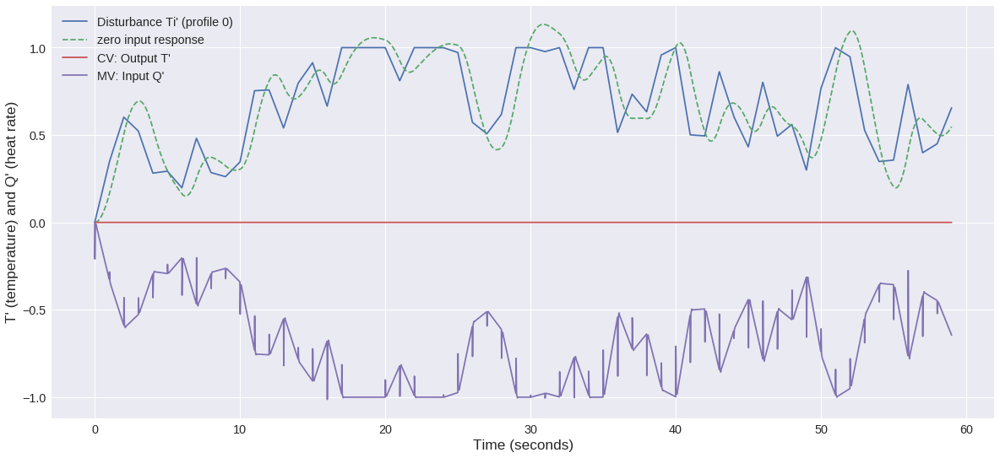

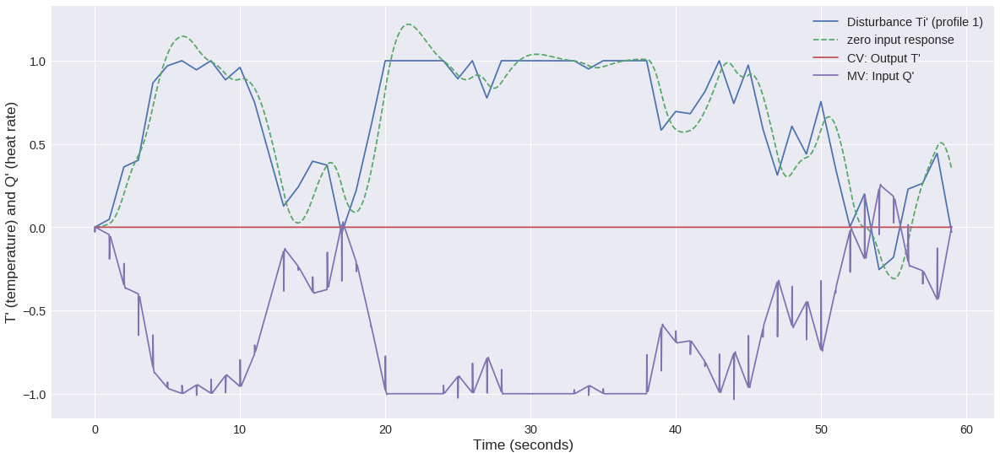

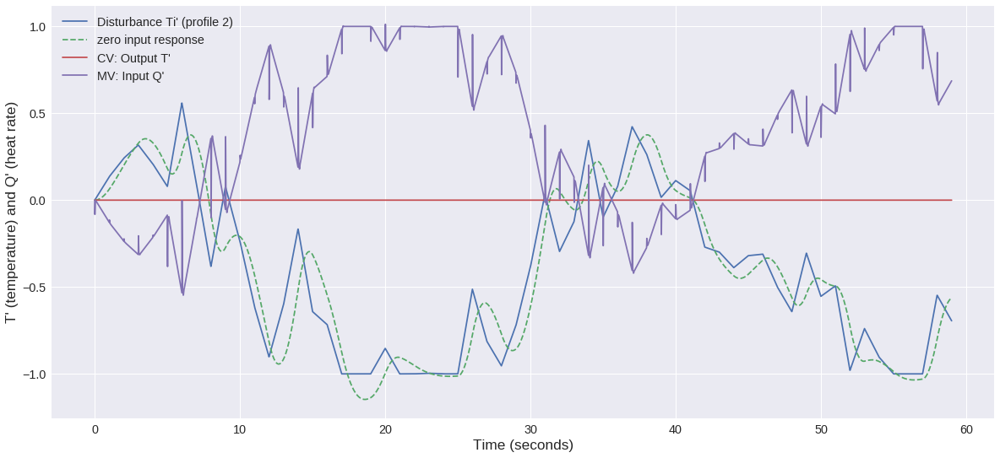

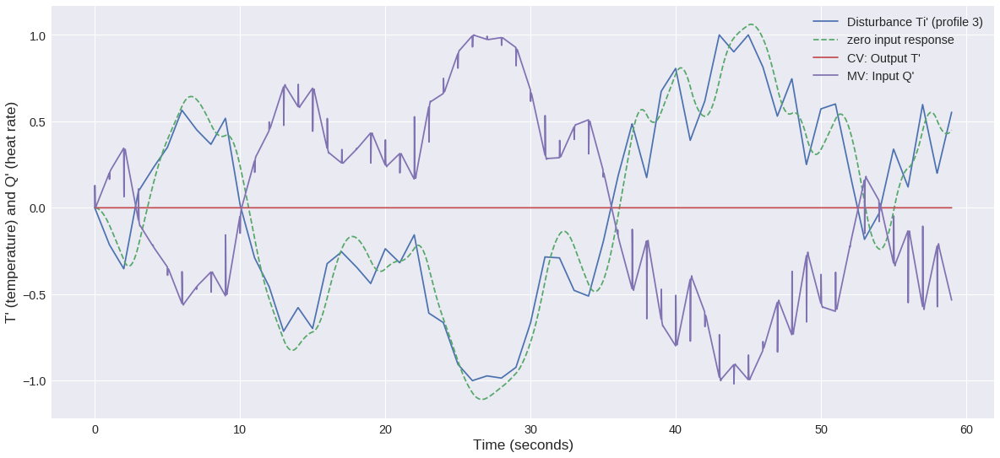

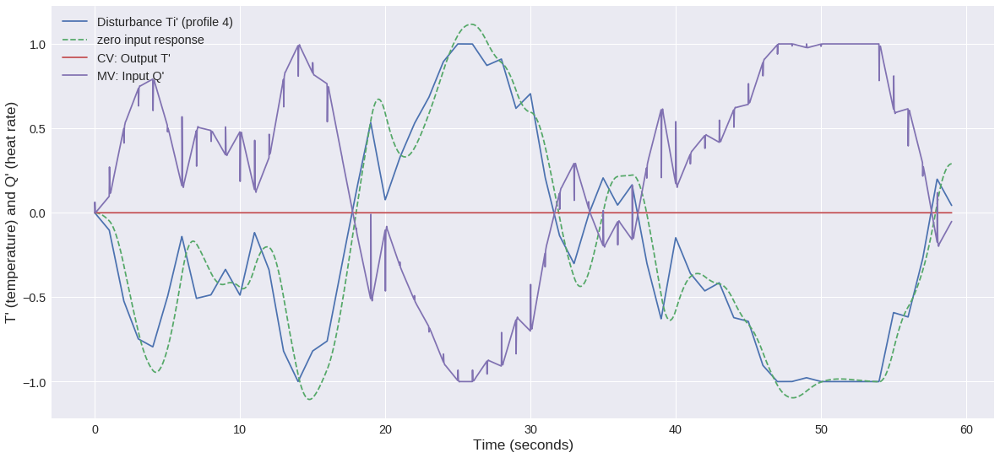

...

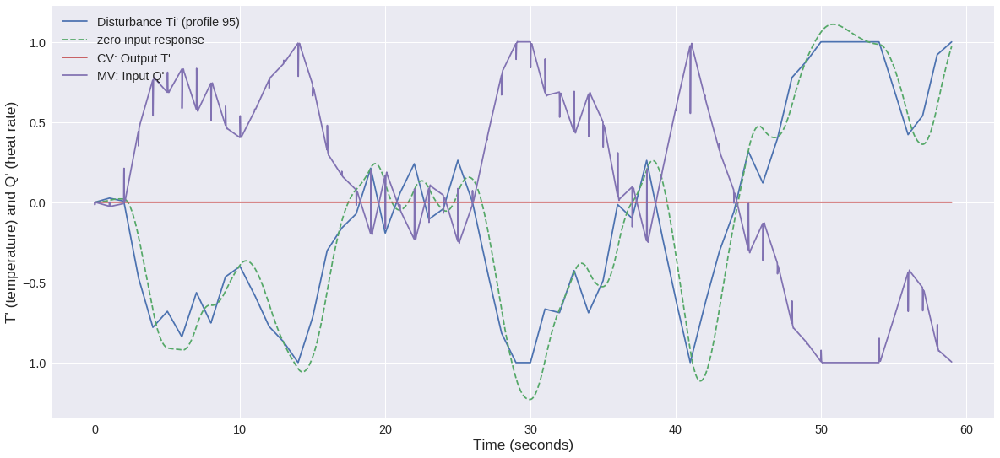

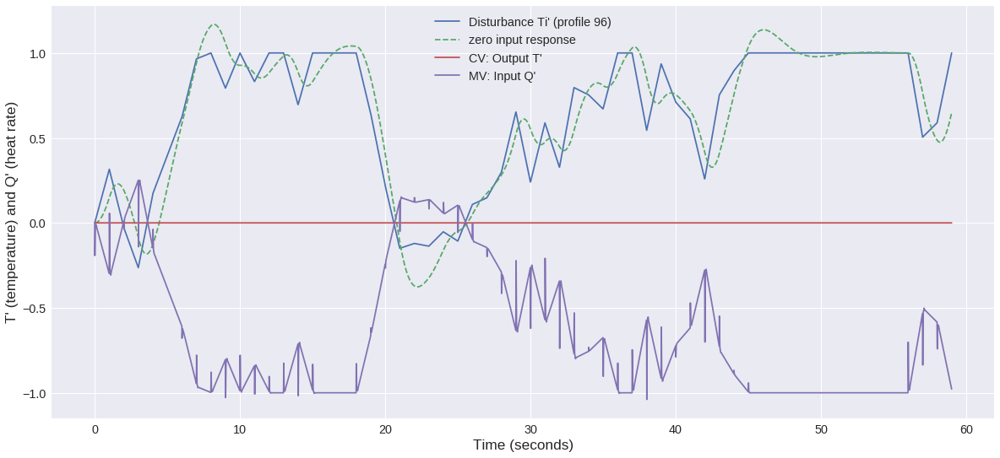

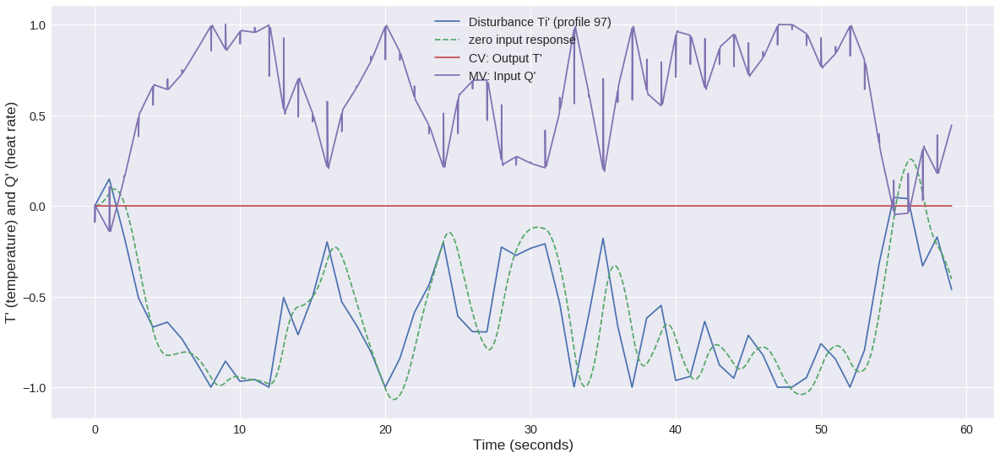

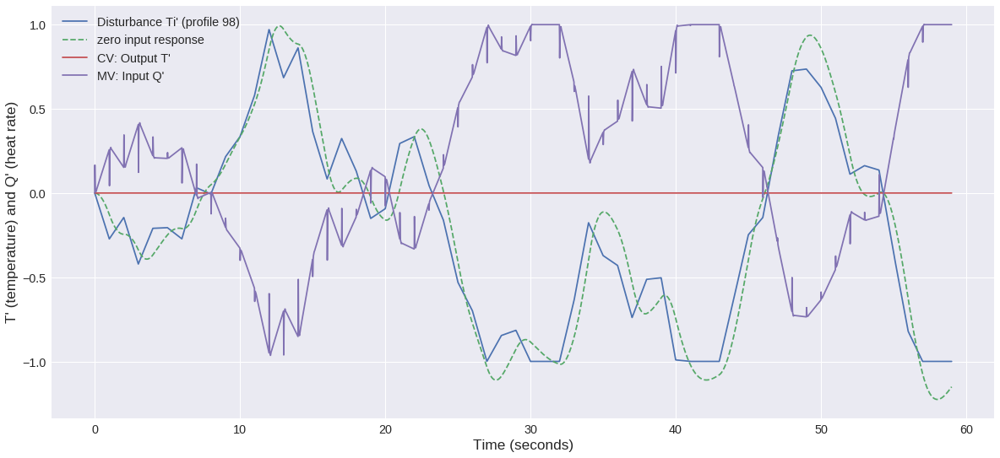

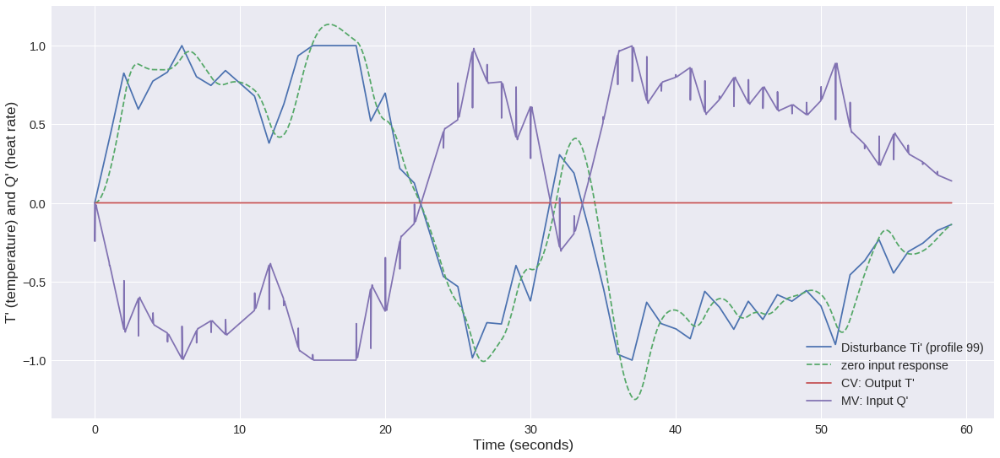

Variables:
KC =   5688.814947611792,
TauI = 0.0002280222206125743,
TauD = 0.4941522520819933,
TauC = 0.006245557968152839

Minimum value of Perf =  4.033307205120107
Maximum value of Perf =  9.255942643545449
Average value of Perf =  6.603490145150944


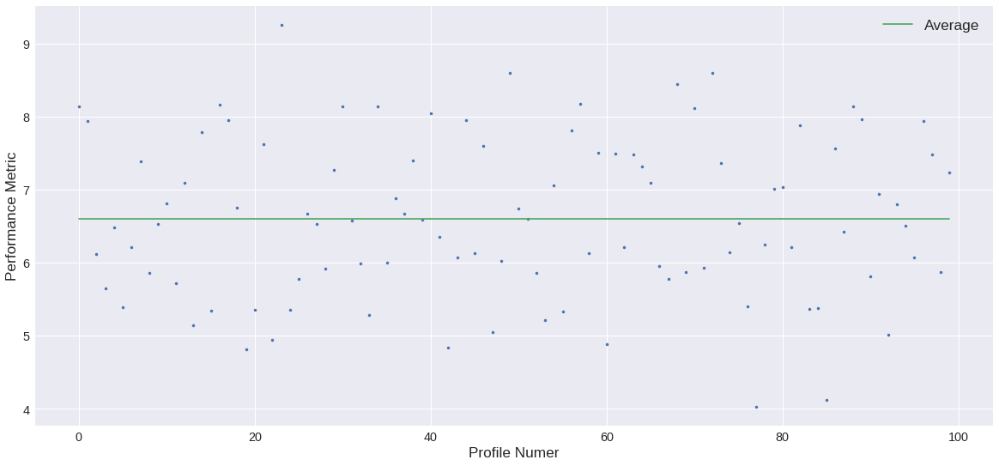

In [2]:
A = masterplan(5688.814947611792, 0.0002280222206125743, 0.4941522520819933, 0.006245557968152839)

In [3]:
print(f'Average error is {A}')

Average error is 6.603490145150944
